In [1]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation import HydraylicAnimation

In [2]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [3]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



[14:29:15] INFO     runn. objective: 3.57, state est.: [1000.01    0.06    0.  ], observation:     ]8;id=878613;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=615135;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    [0.04 0.23], action: [20.], value: 0.0036, time: 0.0000 (0.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[14:29:26] INFO     runn. objective: 3.18, state est.: [1000.04  116.55    7.78], observation: [   ]8;id=76253;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=107613;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    0.14 428.09], action: [20.], value: 0.0068, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:29:40] INFO     runn. objective: 1.23, state est.: [1000.22  191.36   12.79], observation: [   ]8;id=754842;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=929329;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    0.82 702.87], action: [1.91], value: 0.0080, time: 0.0020 (20.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:29:54] INFO     runn. objective: 0.35, state est.: [1000.36  127.95    8.54], observation: [   ]8;id=719261;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=899779;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.33 469.96], action: [-4.12], value: 0.0083, time: 0.0030 (30.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[14:30:11] INFO     runn. objective: 0.11, state est.: [1000.44   53.82    3.59], observation: [   ]8;id=707045;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=93448;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.6  197.69], action: [1.13], value: 0.0084, time: 0.0040 (40.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:30:29] INFO     runn. objective: 0.05, state est.: [1000.46   35.35    2.36], observation: [   ]8;id=133607;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=163749;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.7  129.83], action: [1.13], value: 0.0085, time: 0.0050 (50.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[14:30:48] INFO     runn. objective: 0.02, state est.: [1000.56   30.05    2.  ], observation: [   ]8;id=445899;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=338289;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    2.06 110.37], action: [-5.66], value: 0.0085, time: 0.0060 (60.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

[14:31:08] INFO     runn. objective: 0.04, state est.: [1000.58    5.17    0.34], observation: [   ]8;id=374511;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=391938;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    2.13 18.98], action: [-0.6], value: 0.0085, time: 0.0070 (70.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:31:30] INFO     runn. objective: 0.00, state est.: [1000.51    1.75    0.12], observation:     ]8;id=593942;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=843103;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    [1.88 6.41], action: [1.37], value: 0.0085, time: 0.0080 (80.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:31:59] INFO     runn. objective: 0.03, state est.: [1000.57   -5.09   -0.32], observation: [   ]8;id=636457;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=216326;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    2.11 -18.7 ], action: [-0.], value: 0.0086, time: 0.0090 (90.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[14:32:27] INFO     runn. objective: 0.00, state est.: [1000.54   -1.3    -0.08], observation: [   ]8;id=703217;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=566697;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/regelum/callback.py#1110\1110]8;;\
                    1.99 -4.76], action: [-0.], value: 0.0086, time: 0.0100 (100.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.572728,0.003573,1,1,20.000000,0.036137,0.230759,1000.009838,0.062824,0.004188
1,0.001000,3.180633,0.006753,1,1,20.000000,0.142870,428.090393,1000.038896,116.547610,7.776709
2,0.002000,1.226482,0.007980,1,1,1.911091,0.818837,702.866899,1000.222928,191.355513,12.787467
3,0.003000,0.349960,0.008330,1,1,-4.123901,1.334729,469.958987,1000.363380,127.946334,8.538843
4,0.004000,0.107407,0.008437,1,1,1.132004,1.598573,197.691453,1000.435212,53.821498,3.588780
5,0.005000,0.050987,0.008488,1,1,1.127226,1.700499,129.833158,1000.462961,35.347077,2.356667
6,0.006000,0.017323,0.008506,1,1,-5.657156,2.057921,110.372255,1000.560269,30.048846,2.003377
7,0.007000,0.042247,0.008548,1,1,-0.604162,2.131844,18.975562,1000.580394,5.166097,0.344408
8,0.008000,0.002232,0.008550,1,1,1.365975,1.879055,6.411978,1000.511573,1.745661,0.116378
9,0.009000,0.032834,0.008583,1,1,-0.000718,2.107505,-18.698159,1000.573768,-5.090574,-0.317542


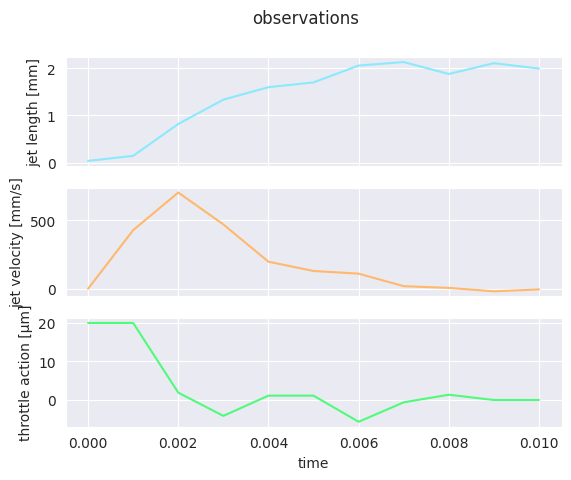

In [4]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [5]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.000000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,2.002641,0.170913,1000.545219,0.046531,-0.738485,107422.336184,100000.000332
99998,9.999800e-03,2.002641,1.402686,1000.545219,0.381881,-0.738485,107422.268461,100000.003643
99999,9.999900e-03,2.002641,0.710854,1000.545219,0.193530,-0.738485,107422.207105,100000.000059
100000,1.000000e-02,2.002641,1.941900,1000.545219,0.528682,-0.738485,107422.144129,100000.003545


## Display data and animation

In [6]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.572728,0.003573,1,1,20.000000,0.036137,0.230759,1000.009838,0.062824,0.004188
1,0.001000,3.180633,0.006753,1,1,20.000000,0.142870,428.090393,1000.038896,116.547610,7.776709
2,0.002000,1.226482,0.007980,1,1,1.911091,0.818837,702.866899,1000.222928,191.355513,12.787467
3,0.003000,0.349960,0.008330,1,1,-4.123901,1.334729,469.958987,1000.363380,127.946334,8.538843
4,0.004000,0.107407,0.008437,1,1,1.132004,1.598573,197.691453,1000.435212,53.821498,3.588780
5,0.005000,0.050987,0.008488,1,1,1.127226,1.700499,129.833158,1000.462961,35.347077,2.356667
6,0.006000,0.017323,0.008506,1,1,-5.657156,2.057921,110.372255,1000.560269,30.048846,2.003377
7,0.007000,0.042247,0.008548,1,1,-0.604162,2.131844,18.975562,1000.580394,5.166097,0.344408
8,0.008000,0.002232,0.008550,1,1,1.365975,1.879055,6.411978,1000.511573,1.745661,0.116378
9,0.009000,0.032834,0.008583,1,1,-0.000718,2.107505,-18.698159,1000.573768,-5.090574,-0.317542


In [7]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

[14:37:57] INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=658109;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=30595;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

In [8]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize.gif')
# save last frame
anim_cl.save_last_frame('../results/system_last_observation_mpc_noize.pdf')

[14:39:13] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=537483;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=871350;file:///home/kalexu/.pyenv/versions/3.11.8/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\